# Pavimentos-Brasil — Classificação Automática de Defeitos com ICM

**Dataset:** [Pavimentos-Brasil](https://www.kaggle.com/datasets/mateusserafim/pavimentosbrasil) (~9.000 imagens de rodovias do CE e PI)
**Objetivo:** Classificar defeitos de pavimento (buracos, remendos, trincas etc.) para apoiar o cálculo do **ICM/DNIT**
**Modelo:** Transfer Learning com **EfficientNetB0** (PyTorch)
**Ambiente:** Google Colab — GPU T4

---
> **Antes de executar:** Faça upload do seu `kaggle.json` quando solicitado na Seção 1.

---
## Setup

In [ ]:

DATA_DIR = '/content/pavimentos'
MODEL_DIR = '/content/drive/MyDrive/pavimentos_model'
KAGGLE_DATASET = 'mateusserafim/pavimentosbrasil'

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_EPOCHS = 30
LEARNING_RATE = 1e-4
PATIENCE = 5
SEED = 42

TRAIN_SPLIT = 0.70
VAL_SPLIT = 0.15
TEST_SPLIT = 0.15

print(' Configurações definidas.')

 Configurações definidas.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

!pip install -q kaggle timm grad-cam torchmetrics

print(' Dependências instaladas.')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 79.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 67.2 MB/s eta 0:00:00
 Dependências instaladas.


In [ ]:
%matplotlib inline

import os, json, shutil, random, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm
from collections import Counter

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split, Subset
from torchvision import transforms, models
from torchvision.datasets import ImageFolder
from torchmetrics.classification import MulticlassROC, MulticlassConfusionMatrix

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import label_binarize

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f' Dispositivo: {DEVICE}')
if DEVICE.type == 'cuda':
 print(f' GPU: {torch.cuda.get_device_name(0)}')

warnings.filterwarnings('ignore')

 Dispositivo: cuda
 GPU: Tesla T4


In [ ]:

from google.colab import files, drive

drive.mount('/content/drive')
os.makedirs(MODEL_DIR, exist_ok=True)

print(' Faça upload do seu kaggle.json:')
uploaded = files.upload()

kaggle_dir = Path('/root/.kaggle')
kaggle_dir.mkdir(parents=True, exist_ok=True)
shutil.move('kaggle.json', kaggle_dir / 'kaggle.json')
os.chmod(kaggle_dir / 'kaggle.json', 0o600)

os.makedirs(DATA_DIR, exist_ok=True)
!kaggle datasets download -d {KAGGLE_DATASET} -p {DATA_DIR} --unzip

print(f'\n Dataset baixado em: {DATA_DIR}')
!find {DATA_DIR} -maxdepth 2 -type d | head -20

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Faça upload do seu kaggle.json:


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/mateusserafim/pavimentosbrasil
License(s): unknown
100% 1.86G/1.86G [00:26<00:00, 75.0MB/s]


 Dataset baixado em: /content/pavimentos
/content/pavimentos
/content/pavimentos/BR-343(trecho_01)
/content/pavimentos/BR-343(trecho_01)/BR-343(trecho_01)
/content/pavimentos/BR-402(trecho_02)
/content/pavimentos/BR-402(trecho_02)/BR-402(trecho_02)
/content/pavimentos/CE-456
/content/pavimentos/CE-456/CE-456
/content/pavimentos/BR-402(trecho_01)
/content/pavimentos/BR-402(trecho_01)/BR-402(trecho_01)
/content/pavimentos/BR-122(trecho_04)
/content/pavimentos/BR-122(trecho_04)/BR-122(trecho_04)
/content/pavimentos/BR-343(trecho_02)
/content/pavimentos/BR-343(trecho_02)/BR-343(trecho_02)
/content/pavimentos/Av-contorno(trecho_02)
/content/pavimentos/Av-contorno(trecho_02)/Av-contorno(trecho_02)
/content/pavimentos/BR-122(trecho_01)
/content/pavimentos/BR-122(trecho_01)/BR-122(trecho_01)
/content/pavimentos/CE-060
/cont

---
## Análise Exploratória de Dados (EDA)

In [ ]:
dataset_path = Path(DATA_DIR)

image_paths, labels = [], []
class_dirs = sorted([d for d in dataset_path.rglob('*') if d.is_dir() and
      any(f.suffix.lower() in ['.jpg', '.jpeg', '.png']
          for f in d.iterdir() if f.is_file())])

CLASS_NAMES = sorted(list(set(d.name for d in class_dirs)))
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_NAMES)}
NUM_CLASSES = len(CLASS_NAMES)

for class_dir in class_dirs:
  for img_file in class_dir.glob('*.[jJpP][pPnN][gG]*'):
    image_paths.append(str(img_file))
    labels.append(class_dir.name)

df = pd.DataFrame({'path': image_paths, 'label': labels})
df['class_idx'] = df['label'].map(CLASS_TO_IDX)

print(f' Total de imagens : {len(df):,}')
print(f' Classes detectadas: {NUM_CLASSES} → {CLASS_NAMES}')
print('\nDistribuição por classe:')
print(df['label'].value_counts().to_string())

 Total de imagens : 3,549
 Classes detectadas: 10 → ['Av-contorno(trecho_01)', 'Av-contorno(trecho_02)', 'BR-122(trecho_01)', 'BR-122(trecho_04)', 'BR-343(trecho_01)', 'BR-343(trecho_02)', 'BR-402(trecho_01)', 'BR-402(trecho_02)', 'CE-060', 'CE-456']

Distribuição por classe:
label
CE-456                    1242
BR-343(trecho_02)          423
BR-122(trecho_01)          406
BR-343(trecho_01)          337
Av-contorno(trecho_02)     332
CE-060                     272
Av-contorno(trecho_01)     160
BR-402(trecho_02)          127
BR-122(trecho_04)          125
BR-402(trecho_01)          125


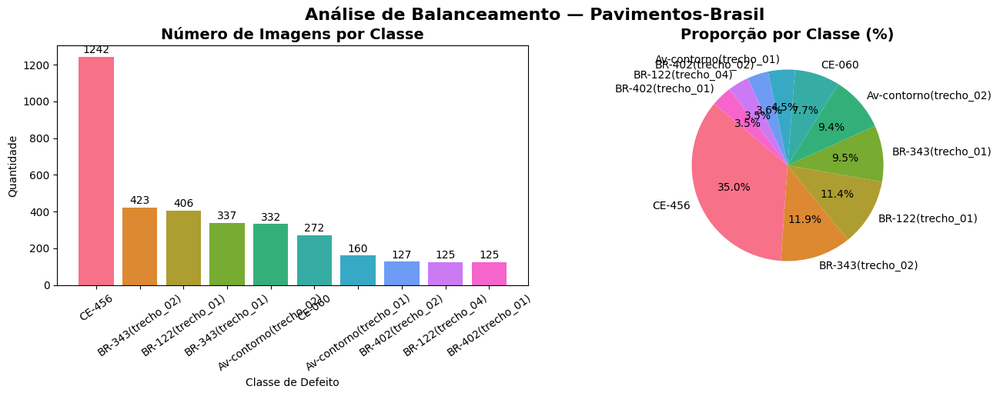

 DESBALANCEAMENTO DETECTADO — Razão max/min = 9.9x
 → Será aplicado class_weight no treinamento.


In [ ]:

counts = df['label'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].bar(counts.index, counts.values,
 color=sns.color_palette('husl', NUM_CLASSES))
axes[0].set_title('Número de Imagens por Classe', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Classe de Defeito')
axes[0].set_ylabel('Quantidade')
axes[0].tick_params(axis='x', rotation=35)
for i, v in enumerate(counts.values):
 axes[0].text(i, v + 20, str(v), ha='center', fontsize=10)

axes[1].pie(counts.values, labels=counts.index, autopct='%1.1f%%',
 colors=sns.color_palette('husl', NUM_CLASSES), startangle=140)
axes[1].set_title('Proporção por Classe (%)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.suptitle('Análise de Balanceamento — Pavimentos-Brasil', y=1.02,
 fontsize=16, fontweight='bold')
plt.savefig('/content/eda_distribuicao.png', bbox_inches='tight', dpi=150)
plt.show()

ratio = counts.max() / counts.min()
if ratio > 3:
 print(f' DESBALANCEAMENTO DETECTADO — Razão max/min = {ratio:.1f}x')
 print(' → Será aplicado class_weight no treinamento.')
else:
 print(f' Dataset razoavelmente balanceado (razão max/min = {ratio:.1f}x)')

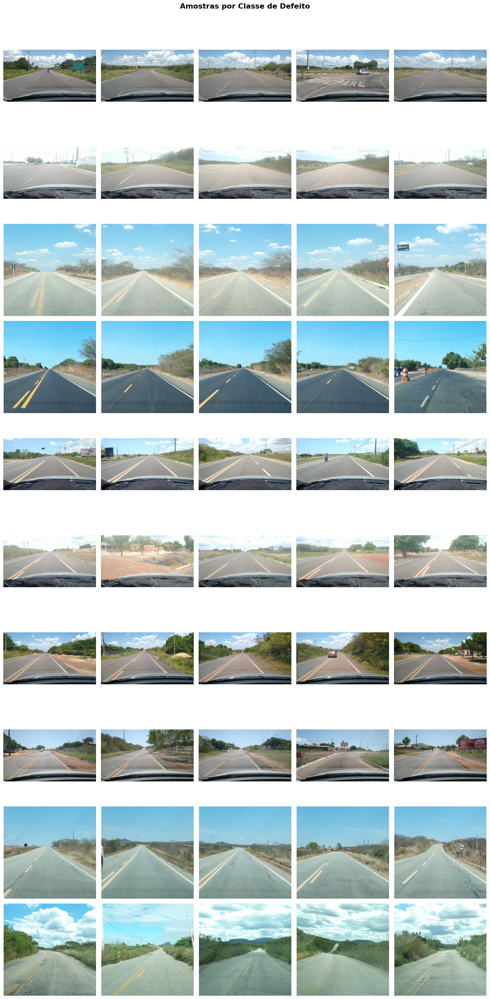

In [ ]:

fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(15, 3 * NUM_CLASSES))
if NUM_CLASSES == 1:
  axes = [axes]

for row, cls in enumerate(CLASS_NAMES):
  sample_paths = df[df['label'] == cls]['path'].sample(
      min(5, len(df[df['label'] == cls])), random_state=SEED).tolist()
  for col, img_path in enumerate(sample_paths):
    img = Image.open(img_path).convert('RGB')
    axes[row][col].imshow(img)
    axes[row][col].axis('off')
    if col == 0:
      axes[row][col].set_ylabel(cls, fontsize=11, fontweight='bold',
          rotation=0, labelpad=80, va='center')

plt.suptitle('Amostras por Classe de Defeito', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('/content/eda_amostras.png', bbox_inches='tight', dpi=120)
plt.show()

Lendo dimensões:   0%|          | 0/300 [00:00<?, ?it/s]

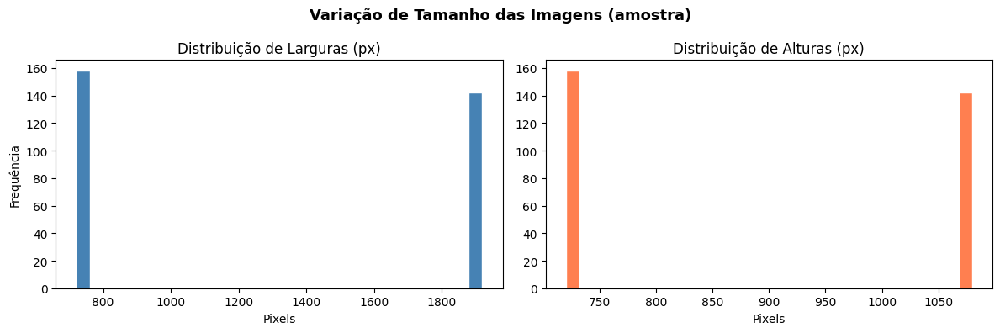

Largura — média: 1288px | min: 720 | max: 1920
Altura — média: 890px | min: 720 | max: 1080

→ Todas serão redimensionadas para 224x224 no pré-processamento.


In [ ]:
sample_df = df.sample(min(300, len(df)), random_state=SEED)
widths, heights = [], []

for path in tqdm(sample_df['path'], desc='Lendo dimensões'):
  try:
    w, h = Image.open(path).size
    widths.append(w)
    heights.append(h)
  except Exception:
    pass

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(widths, bins=30, color='steelblue', edgecolor='white')
axes[0].set_title('Distribuição de Larguras (px)')
axes[0].set_xlabel('Pixels'); axes[0].set_ylabel('Frequência')

axes[1].hist(heights, bins=30, color='coral', edgecolor='white')
axes[1].set_title('Distribuição de Alturas (px)')
axes[1].set_xlabel('Pixels')

plt.suptitle('Variação de Tamanho das Imagens (amostra)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/eda_dimensoes.png', bbox_inches='tight', dpi=120)
plt.show()

print(f'Largura — média: {np.mean(widths):.0f}px | min: {min(widths)} | max: {max(widths)}')
print(f'Altura — média: {np.mean(heights):.0f}px | min: {min(heights)} | max: {max(heights)}')
print(f'\n→ Todas serão redimensionadas para {IMG_SIZE}x{IMG_SIZE} no pré-processamento.')

---
## Pré-processamento e Data Augmentation

In [ ]:

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
 transforms.Resize((IMG_SIZE, IMG_SIZE)),
 transforms.RandomHorizontalFlip(p=0.5),
 transforms.RandomVerticalFlip(p=0.2),
 transforms.RandomRotation(degrees=15),
 transforms.ColorJitter(brightness=0.3,
 contrast=0.3,
 saturation=0.2),
 transforms.RandomAffine(degrees=0, shear=10),
 transforms.ToTensor(),
 transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_transform = transforms.Compose([
 transforms.Resize((IMG_SIZE, IMG_SIZE)),
 transforms.ToTensor(),
 transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print(' Transformações definidas.')
print(f' Treino : {len(train_transform.transforms)} etapas (com augmentation)')
print(f' Val/Teste: {len(val_transform.transforms)} etapas (sem augmentation)')

 Transformações definidas.
 Treino : 8 etapas (com augmentation)
 Val/Teste: 3 etapas (sem augmentation)


In [ ]:

class PavimentosDataset(Dataset):
  """Dataset PyTorch para as imagens de pavimento."""
  def __init__(self, paths, labels, transform=None):
    self.paths = paths
    self.labels = labels
    self.transform = transform

  def __len__(self):
    return len(self.paths)

  def __getitem__(self, idx):
    img = Image.open(self.paths[idx]).convert('RGB')
    if self.transform:
      img = self.transform(img)
    return img, self.labels[idx]


all_paths = df['path'].tolist()
all_labels = df['class_idx'].tolist()

train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_paths, all_labels,
    test_size=(VAL_SPLIT + TEST_SPLIT),
    stratify=all_labels,
    random_state=SEED
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels,
    test_size=TEST_SPLIT / (VAL_SPLIT + TEST_SPLIT),
    stratify=temp_labels,
    random_state=SEED
)

train_dataset = PavimentosDataset(train_paths, train_labels, transform=train_transform)
val_dataset = PavimentosDataset(val_paths, val_labels, transform=val_transform)
test_dataset = PavimentosDataset(test_paths, test_labels, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=2, pin_memory=True)

print(f' Split concluído:')
print(f' Treino : {len(train_dataset):,} imagens ({TRAIN_SPLIT*100:.0f}%)')
print(f' Validação : {len(val_dataset):,} imagens ({VAL_SPLIT*100:.0f}%)')
print(f' Teste : {len(test_dataset):,} imagens ({TEST_SPLIT*100:.0f}%)')

 Split concluído:
 Treino : 2,484 imagens (70%)
 Validação : 532 imagens (15%)
 Teste : 533 imagens (15%)


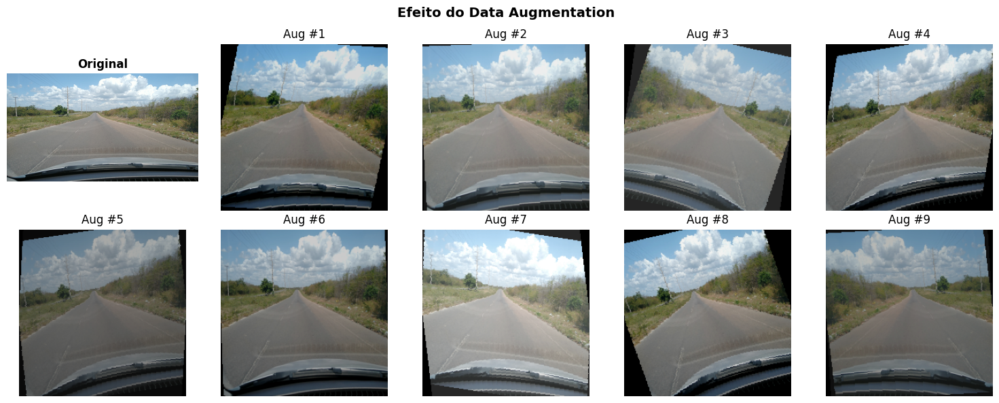

In [ ]:

sample_img = Image.open(train_paths[0]).convert('RGB')

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes[0][0].imshow(sample_img)
axes[0][0].set_title('Original', fontweight='bold')
axes[0][0].axis('off')

aug_transform_vis = transforms.Compose([
 t for t in train_transform.transforms if not isinstance(t, (transforms.Normalize, transforms.ToTensor))
])

for i, ax in enumerate(axes.flatten()[1:]):
 aug_img = aug_transform_vis(sample_img)
 ax.imshow(aug_img)
 ax.set_title(f'Aug #{i+1}')
 ax.axis('off')

plt.suptitle('Efeito do Data Augmentation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/augmentation_preview.png', bbox_inches='tight', dpi=120)
plt.show()

---
## Modelagem (Transfer Learning com EfficientNetB0)

In [ ]:
def build_efficientnet(num_classes, freeze_backbone=True):
  """
  Constrói o EfficientNetB0 com cabeça de classificação personalizada.
  - Backbone pré-treinado no ImageNet
  - Fine-tuning parcial: apenas as 2 últimas camadas são desbloqueadas
  """
  model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)

  if freeze_backbone:
    for param in model.parameters():
      param.requires_grad = False

  backbone_layers = list(model.features.children())
  for layer in backbone_layers[-2:]:
    for param in layer.parameters():
      param.requires_grad = True

  in_features = model.classifier[1].in_features
  model.classifier = nn.Sequential(
      nn.Dropout(p=0.4),
      nn.Linear(in_features, 512),
      nn.ReLU(),
      nn.BatchNorm1d(512),
      nn.Dropout(p=0.3),
      nn.Linear(512, num_classes)
  )

  return model


model = build_efficientnet(NUM_CLASSES).to(DEVICE)

total = sum(p.numel() for p in model.parameters())
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen = total - trainable

print(f' Arquitetura: EfficientNetB0 + cabeça personalizada')
print(f' Classes de saída : {NUM_CLASSES} → {CLASS_NAMES}')
print(f' Parâmetros totais : {total:,}')
print(f' Treináveis : {trainable:,} ({trainable/total*100:.1f}%)')
print(f' Congelados : {frozen:,} ({frozen/total*100:.1f}%)')

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 168MB/s]


 Arquitetura: EfficientNetB0 + cabeça personalizada
 Classes de saída : 10 → ['Av-contorno(trecho_01)', 'Av-contorno(trecho_02)', 'BR-122(trecho_01)', 'BR-122(trecho_04)', 'BR-343(trecho_01)', 'BR-343(trecho_02)', 'BR-402(trecho_01)', 'BR-402(trecho_02)', 'CE-060', 'CE-456']
 Parâmetros totais : 4,669,574
 Treináveis : 1,791,418 (38.4%)
 Congelados : 2,878,156 (61.6%)


In [ ]:
label_counts = Counter(train_labels)
total_train = len(train_labels)
class_weights = torch.tensor(
 [total_train / (NUM_CLASSES * label_counts[i]) for i in range(NUM_CLASSES)],
 dtype=torch.float32
).to(DEVICE)

criterion = nn.CrossEntropyLoss(weight=class_weights)

optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
 lr=LEARNING_RATE, weight_decay=1e-4)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
 optimizer, mode='min', factor=0.5, patience=3
)

print(' Critério, otimizador e scheduler configurados.')
print(f' Class weights: { {CLASS_NAMES[i]: f"{w:.3f}" for i, w in enumerate(class_weights.cpu())} }')

 Critério, otimizador e scheduler configurados.
 Class weights: {'Av-contorno(trecho_01)': '2.218', 'Av-contorno(trecho_02)': '1.071', 'BR-122(trecho_01)': '0.875', 'BR-122(trecho_04)': '2.823', 'BR-343(trecho_01)': '1.053', 'BR-343(trecho_02)': '0.839', 'BR-402(trecho_01)': '2.823', 'BR-402(trecho_02)': '2.791', 'CE-060': '1.307', 'CE-456': '0.286'}


---
## Treinamento com Early Stopping

In [ ]:
BEST_MODEL_PATH = os.path.join(MODEL_DIR, 'efficientnetb0_pavimentos_best.pt')

history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

best_val_loss = float('inf')
patience_count = 0


def run_epoch(loader, is_train=True):
  """Executa uma época de treino ou validação e retorna loss/accuracy."""
  model.train() if is_train else model.eval()
  total_loss, correct, total = 0.0, 0, 0

  ctx = torch.enable_grad() if is_train else torch.no_grad()
  with ctx:
    for images, labels_batch in loader:
      images = images.to(DEVICE)
      labels_batch = labels_batch.to(DEVICE)

      if is_train:
        optimizer.zero_grad()

      outputs = model(images)
      loss = criterion(outputs, labels_batch)

      if is_train:
        loss.backward()
        optimizer.step()

      total_loss += loss.item() * images.size(0)
      preds = outputs.argmax(dim=1)
      correct += (preds == labels_batch).sum().item()
      total += images.size(0)

  return total_loss / total, correct / total


print(f' Iniciando treinamento por até {NUM_EPOCHS} épocas (early stop={PATIENCE})...\n')

epoch_bar = tqdm(range(1, NUM_EPOCHS + 1), desc='Épocas')
for epoch in epoch_bar:
  train_loss, train_acc = run_epoch(train_loader, is_train=True)

  val_loss, val_acc = run_epoch(val_loader, is_train=False)

  scheduler.step(val_loss)

  history['train_loss'].append(train_loss)
  history['val_loss'].append(val_loss)
  history['train_acc'].append(train_acc)
  history['val_acc'].append(val_acc)

  epoch_bar.set_postfix(
      tr_loss=f'{train_loss:.4f}', val_loss=f'{val_loss:.4f}',
      tr_acc=f'{train_acc:.3f}', val_acc=f'{val_acc:.3f}'
  )

  if val_loss < best_val_loss:
    best_val_loss = val_loss
    patience_count = 0
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state': optimizer.state_dict(),
        'val_loss': val_loss,
        'val_acc': val_acc,
        'class_names': CLASS_NAMES,
    }, BEST_MODEL_PATH)
    tqdm.write(f' Checkpoint salvo (epoch {epoch} | val_loss={val_loss:.4f})')
  else:
    patience_count += 1
    if patience_count >= PATIENCE:
      tqdm.write(f'\n Early stopping na época {epoch} (sem melhora por {PATIENCE} épocas)')
      break

print(f'\n Treinamento concluído. Melhor val_loss: {best_val_loss:.4f}')

 Iniciando treinamento por até 30 épocas (early stop=5)...



Épocas:   0%|          | 0/30 [00:00<?, ?it/s]

 Checkpoint salvo (epoch 1 | val_loss=0.3237)
 Checkpoint salvo (epoch 2 | val_loss=0.1402)
 Checkpoint salvo (epoch 3 | val_loss=0.0758)
 Checkpoint salvo (epoch 4 | val_loss=0.0435)
 Checkpoint salvo (epoch 5 | val_loss=0.0375)
 Checkpoint salvo (epoch 6 | val_loss=0.0360)
 Checkpoint salvo (epoch 7 | val_loss=0.0296)
 Checkpoint salvo (epoch 8 | val_loss=0.0234)
 Checkpoint salvo (epoch 9 | val_loss=0.0226)
 Checkpoint salvo (epoch 11 | val_loss=0.0157)
 Checkpoint salvo (epoch 13 | val_loss=0.0127)
 Checkpoint salvo (epoch 18 | val_loss=0.0103)
 Checkpoint salvo (epoch 20 | val_loss=0.0082)
 Checkpoint salvo (epoch 21 | val_loss=0.0067)
 Checkpoint salvo (epoch 25 | val_loss=0.0055)

 Early stopping na época 30 (sem melhora por 5 épocas)

 Treinamento concluído. Melhor val_loss: 0.0055


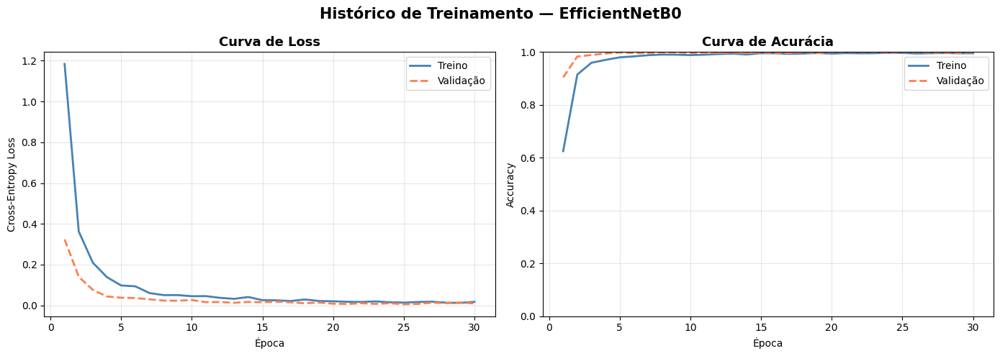

In [ ]:

epochs_ran = len(history['train_loss'])
ep_range = range(1, epochs_ran + 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(ep_range, history['train_loss'], label='Treino', color='steelblue', linewidth=2)
axes[0].plot(ep_range, history['val_loss'], label='Validação', color='coral', linewidth=2, linestyle='--')
axes[0].set_title('Curva de Loss', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Época'); axes[0].set_ylabel('Cross-Entropy Loss')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(ep_range, history['train_acc'], label='Treino', color='steelblue', linewidth=2)
axes[1].plot(ep_range, history['val_acc'], label='Validação', color='coral', linewidth=2, linestyle='--')
axes[1].set_title('Curva de Acurácia', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Época'); axes[1].set_ylabel('Accuracy')
axes[1].legend(); axes[1].grid(alpha=0.3)
axes[1].set_ylim(0, 1)

plt.suptitle('Histórico de Treinamento — EfficientNetB0', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/training_curves.png', bbox_inches='tight', dpi=150)
plt.show()

---
## Avaliação no Conjunto de Teste

In [ ]:
checkpoint = torch.load(BEST_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f" Melhor modelo carregado (epoch {checkpoint['epoch']} | val_acc={checkpoint['val_acc']:.4f})")

all_preds, all_trues, all_probs = [], [], []

with torch.no_grad():
  for images, labels_batch in tqdm(test_loader, desc='Avaliando'):
    images = images.to(DEVICE)
    outputs = model(images)
    probs = torch.softmax(outputs, dim=1).cpu().numpy()
    preds = outputs.argmax(dim=1).cpu().numpy()

    all_preds.extend(preds)
    all_trues.extend(labels_batch.numpy())
    all_probs.extend(probs)

all_preds = np.array(all_preds)
all_trues = np.array(all_trues)
all_probs = np.array(all_probs)

print(f'Total avaliado: {len(all_preds):,} imagens')

 Melhor modelo carregado (epoch 25 | val_acc=1.0000)


Avaliando:   0%|          | 0/17 [00:00<?, ?it/s]

Total avaliado: 533 imagens


In [ ]:

print('=' * 60)
print(' RELATÓRIO DE CLASSIFICAÇÃO — CONJUNTO DE TESTE')
print('=' * 60)
print(classification_report(all_trues, all_preds, target_names=CLASS_NAMES))

overall_acc = (all_preds == all_trues).mean()
print(f'Acurácia geral: {overall_acc:.4f} ({overall_acc*100:.2f}%)')

 RELATÓRIO DE CLASSIFICAÇÃO — CONJUNTO DE TESTE
                        precision    recall  f1-score   support

Av-contorno(trecho_01)       0.96      1.00      0.98        24
Av-contorno(trecho_02)       1.00      1.00      1.00        50
     BR-122(trecho_01)       1.00      1.00      1.00        61
     BR-122(trecho_04)       1.00      1.00      1.00        18
     BR-343(trecho_01)       1.00      1.00      1.00        51
     BR-343(trecho_02)       1.00      1.00      1.00        64
     BR-402(trecho_01)       1.00      0.94      0.97        18
     BR-402(trecho_02)       1.00      1.00      1.00        19
                CE-060       1.00      1.00      1.00        41
                CE-456       1.00      1.00      1.00       187

              accuracy                           1.00       533
             macro avg       1.00      0.99      1.00       533
          weighted avg       1.00      1.00      1.00       533

Acurácia geral: 0.9981 (99.81%)


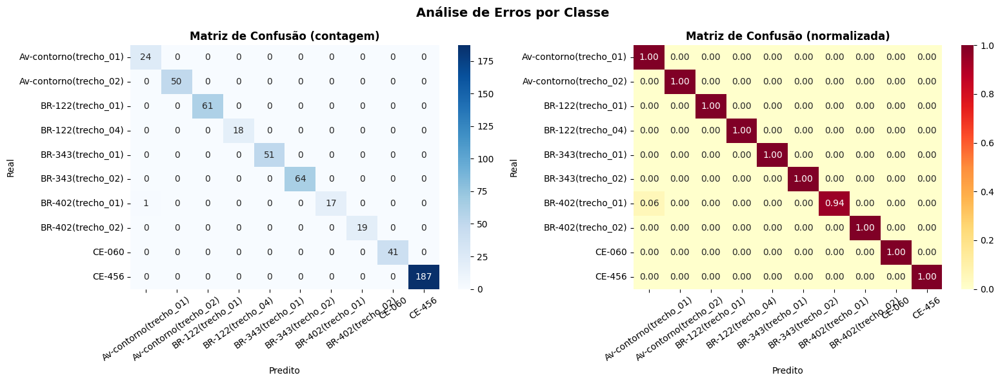

In [ ]:

from sklearn.metrics import confusion_matrix

cm_matrix = confusion_matrix(all_trues, all_preds)

cm_norm = cm_matrix.astype('float') / cm_matrix.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues',
 xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=axes[0])
axes[0].set_title('Matriz de Confusão (contagem)', fontweight='bold')
axes[0].set_xlabel('Predito'); axes[0].set_ylabel('Real')
axes[0].tick_params(axis='x', rotation=35)

sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='YlOrRd',
 xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=axes[1])
axes[1].set_title('Matriz de Confusão (normalizada)', fontweight='bold')
axes[1].set_xlabel('Predito'); axes[1].set_ylabel('Real')
axes[1].tick_params(axis='x', rotation=35)

plt.suptitle('Análise de Erros por Classe', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', bbox_inches='tight', dpi=150)
plt.show()

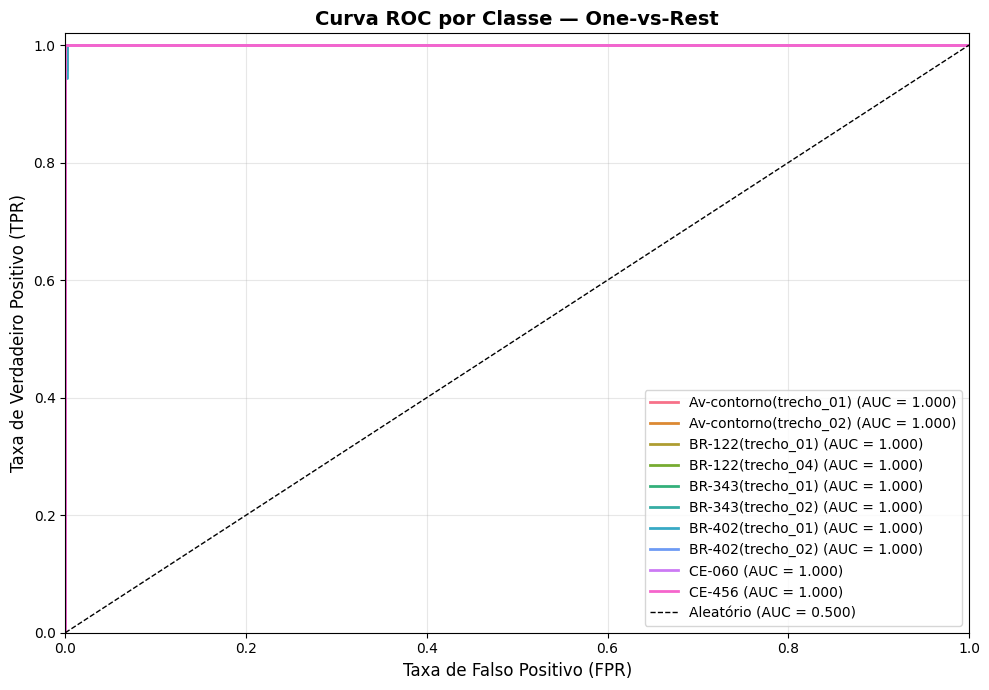

In [ ]:

from sklearn.metrics import roc_curve, auc

y_true_bin = label_binarize(all_trues, classes=list(range(NUM_CLASSES)))

fig, ax = plt.subplots(figsize=(10, 7))
colors = sns.color_palette('husl', NUM_CLASSES)

for i, (cls_name, color) in enumerate(zip(CLASS_NAMES, colors)):
 fpr, tpr, _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
 roc_auc = auc(fpr, tpr)
 ax.plot(fpr, tpr, color=color, lw=2,
 label=f'{cls_name} (AUC = {roc_auc:.3f})')

ax.plot([0,1], [0,1], 'k--', lw=1, label='Aleatório (AUC = 0.500)')
ax.set_xlim([0, 1]); ax.set_ylim([0, 1.02])
ax.set_xlabel('Taxa de Falso Positivo (FPR)', fontsize=12)
ax.set_ylabel('Taxa de Verdadeiro Positivo (TPR)', fontsize=12)
ax.set_title('Curva ROC por Classe — One-vs-Rest', fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=10)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('/content/roc_curves.png', bbox_inches='tight', dpi=150)
plt.show()

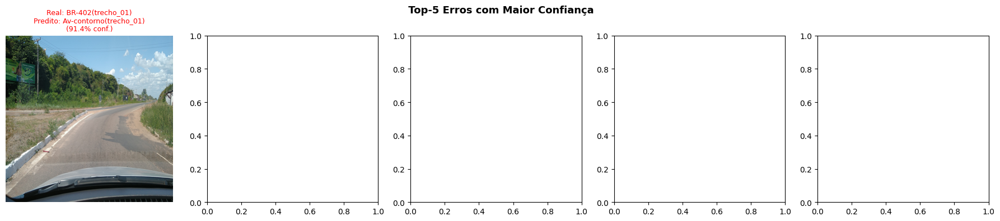

In [ ]:

wrong_mask = all_preds != all_trues
wrong_idxs = np.where(wrong_mask)[0]

wrong_confs = all_probs[wrong_idxs, all_preds[wrong_idxs]]
top5_idxs = wrong_idxs[np.argsort(wrong_confs)[::-1][:5]]

fig, axes = plt.subplots(1, 5, figsize=(18, 4))
for ax, idx in zip(axes, top5_idxs):
 img = Image.open(test_paths[idx]).convert('RGB').resize((300, 300))
 ax.imshow(img)
 true_cls = CLASS_NAMES[all_trues[idx]]
 pred_cls = CLASS_NAMES[all_preds[idx]]
 conf = all_probs[idx, all_preds[idx]] * 100
 ax.set_title(f'Real: {true_cls}\nPredito: {pred_cls}\n({conf:.1f}% conf.)',
 fontsize=9, color='red')
 ax.axis('off')

plt.suptitle(' Top-5 Erros com Maior Confiança', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/top5_erros.png', bbox_inches='tight', dpi=120)
plt.show()

---
## Grad-CAM (Explicabilidade Visual)

In [ ]:

class GradCAM:
  """
  Grad-CAM: visualiza as regiões da imagem que mais influenciaram a predição.
  Referência: Selvaraju et al. (2017) — https://arxiv.org/abs/1610.02391
  """
  def __init__(self, model, target_layer):
    self.model = model
    self.target_layer = target_layer
    self.gradients = None
    self.activations = None
    self.hooks = [
        target_layer.register_forward_hook(self._save_activation),
        target_layer.register_full_backward_hook(self._save_gradient),
    ]

  def _save_activation(self, module, input, output):
    self.activations = output.detach()

  def _save_gradient(self, module, grad_input, grad_output):
    self.gradients = grad_output[0].detach()

  def generate(self, input_tensor, class_idx=None):
    """Gera o mapa de calor Grad-CAM para a classe indicada."""
    self.model.eval()
    output = self.model(input_tensor)
    if class_idx is None:
      class_idx = output.argmax(dim=1).item()

    self.model.zero_grad()
    output[0, class_idx].backward()

    weights = self.gradients.mean(dim=[2, 3], keepdim=True)
    cam = (weights * self.activations).sum(dim=1, keepdim=True)
    cam = torch.relu(cam)
    cam = cam.squeeze().cpu().numpy()

    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    return cam, class_idx

  def remove_hooks(self):
    for h in self.hooks:
      h.remove()


target_layer = model.features[-1]
gradcam = GradCAM(model, target_layer)
print(' Grad-CAM inicializado sobre a última camada do backbone.')

 Grad-CAM inicializado sobre a última camada do backbone.


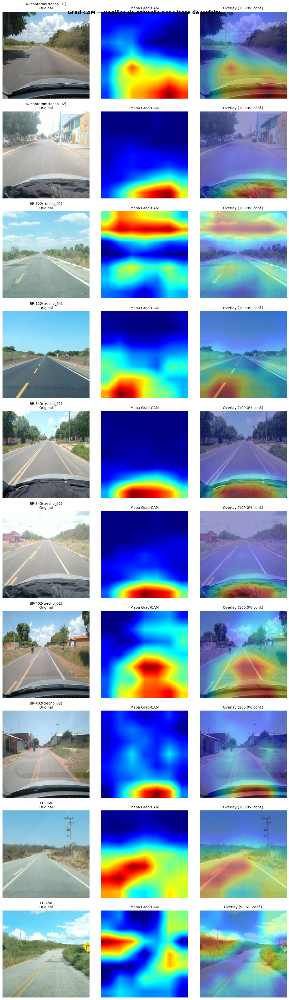

 Grad-CAM salvo em /content/gradcam_visualization.png


In [ ]:

from PIL import Image
import cv2

fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(12, 4 * NUM_CLASSES))
if NUM_CLASSES == 1:
  axes = [axes]

for row, cls_idx in enumerate(range(NUM_CLASSES)):
  cls_name = CLASS_NAMES[cls_idx]

  correct_idxs = np.where((all_trues == cls_idx) & (all_preds == cls_idx))[0]
  if len(correct_idxs) == 0:
    for ax in axes[row]: ax.axis('off')
    continue

  sample_idx = correct_idxs[0]
  img_path = test_paths[sample_idx]
  raw_img = Image.open(img_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))
  input_tensor = val_transform(raw_img).unsqueeze(0).to(DEVICE)
  input_tensor.requires_grad_(True)

  cam, pred_idx = gradcam.generate(input_tensor, class_idx=cls_idx)

  cam_resized = cv2.resize(cam, (IMG_SIZE, IMG_SIZE))
  heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
  heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

  overlay = np.array(raw_img) * 0.6 + heatmap * 0.4
  overlay = np.clip(overlay, 0, 255).astype(np.uint8)

  axes[row][0].imshow(raw_img)
  axes[row][0].set_title(f'{cls_name}\nOriginal', fontsize=10)
  axes[row][0].axis('off')

  axes[row][1].imshow(heatmap)
  axes[row][1].set_title('Mapa Grad-CAM', fontsize=10)
  axes[row][1].axis('off')

  axes[row][2].imshow(overlay)
  conf = all_probs[sample_idx, pred_idx] * 100
  axes[row][2].set_title(f'Overlay ({conf:.1f}% conf.)', fontsize=10)
  axes[row][2].axis('off')

gradcam.remove_hooks()

plt.suptitle('Grad-CAM — Regiões de Ativação por Classe de Defeito',
           fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/gradcam_visualization.png', bbox_inches='tight', dpi=150)
plt.show()
print(' Grad-CAM salvo em /content/gradcam_visualization.png')

---
## Exportação do Modelo e Predições

In [ ]:

EXPORT_PATH_PT = os.path.join(MODEL_DIR, 'efficientnetb0_pavimentos_final.pt')
EXPORT_PATH_SCRIPT = os.path.join(MODEL_DIR, 'efficientnetb0_pavimentos_scripted.pt')

torch.save({
 'model_state_dict': model.state_dict(),
 'class_names': CLASS_NAMES,
 'class_to_idx': CLASS_TO_IDX,
 'img_size': IMG_SIZE,
 'architecture': 'EfficientNetB0',
 'num_classes': NUM_CLASSES,
 'val_acc': checkpoint['val_acc'],
}, EXPORT_PATH_PT)

model.eval()
dummy_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
scripted_model = torch.jit.trace(model, dummy_input)
scripted_model.save(EXPORT_PATH_SCRIPT)

print(f' Modelos exportados:')
print(f' Pesos : {EXPORT_PATH_PT}')
print(f' TorchScript: {EXPORT_PATH_SCRIPT}')

 Modelos exportados:
 Pesos : /content/drive/MyDrive/pavimentos_model/efficientnetb0_pavimentos_final.pt
 TorchScript: /content/drive/MyDrive/pavimentos_model/efficientnetb0_pavimentos_scripted.pt


In [ ]:

CSV_OUTPUT = os.path.join(MODEL_DIR, 'predicoes_teste.csv')

results_df = pd.DataFrame({
 'caminho_imagem': test_paths,
 'classe_real': [CLASS_NAMES[i] for i in all_trues],
 'classe_predita': [CLASS_NAMES[i] for i in all_preds],
 'acerto': (all_preds == all_trues).astype(int),
 'confianca': all_probs.max(axis=1).round(4),
})

for i, cls in enumerate(CLASS_NAMES):
 results_df[f'prob_{cls}'] = all_probs[:, i].round(4)

results_df.to_csv(CSV_OUTPUT, index=False)

print(f' CSV salvo em: {CSV_OUTPUT}')
print(f' Total de predições : {len(results_df):,}')
print(f' Acertos : {results_df["acerto"].sum():,} ({results_df["acerto"].mean()*100:.2f}%)')
print(f'\nPrimeiras 5 linhas:')
results_df.head()

 CSV salvo em: /content/drive/MyDrive/pavimentos_model/predicoes_teste.csv
 Total de predições : 533
 Acertos : 532 (99.81%)

Primeiras 5 linhas:


,caminho_imagem,classe_real,classe_predita,acerto,confianca,prob_Av-contorno(trecho_01),prob_Av-contorno(trecho_02),prob_BR-122(trecho_01),prob_BR-122(trecho_04),prob_BR-343(trecho_01),prob_BR-343(trecho_02),prob_BR-402(trecho_01),prob_BR-402(trecho_02),prob_CE-060,prob_CE-456
0,/content/pavimentos/BR-343(trecho_01)/BR-343(t...,BR-343(trecho_01),BR-343(trecho_01),1,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,/content/pavimentos/BR-343(trecho_02)/BR-343(t...,BR-343(trecho_02),BR-343(trecho_02),1,0.9996,0.0000,0.0000,0.0000,0.0001,0.0001,0.9996,0.0002,0.0000,0.0000,0.0000
2,/content/pavimentos/BR-343(trecho_02)/BR-343(t...,BR-343(trecho_02),BR-343(trecho_02),1,0.9998,0.0000,0.0000,0.0000,0.0000,0.0000,0.9998,0.0001,0.0000,0.0000,0.0000
3,/content/pavimentos/BR-402(trecho_02)/BR-402(t...,BR-402(trecho_02),BR-402(trecho_02),1,0.9999,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9999,0.0000,0.0000
4,/content/pavimentos/CE-456/CE-456/825.jpg,CE-456,CE-456,1,0.9956,0.0003,0.0001,0.0005,0.0002,0.0002,0.0001,0.0021,0.0003,0.0005,0.9956


In [ ]:

from sklearn.metrics import f1_score, accuracy_score

acc = accuracy_score(all_trues, all_preds)
f1m = f1_score(all_trues, all_preds, average='macro')
f1w = f1_score(all_trues, all_preds, average='weighted')

print('='*60)
print(' RESUMO FINAL — PAVIMENTOS-BRASIL ICM')
print('='*60)
print(f' Modelo : EfficientNetB0 (Transfer Learning)')
print(f' Classes : {NUM_CLASSES} ({", ".join(CLASS_NAMES)})')
print(f' Imagens de treino : {len(train_dataset):,}')
print(f' Imagens de teste : {len(test_dataset):,}')
print(f' Acurácia : {acc:.4f} ({acc*100:.2f}%)')
print(f' F1 Macro : {f1m:.4f}')
print(f' F1 Weighted : {f1w:.4f}')
print(f' Modelo salvo em : {EXPORT_PATH_PT}')
print(f' CSV salvo em : {CSV_OUTPUT}')
print('='*60)

 RESUMO FINAL — PAVIMENTOS-BRASIL ICM
 Modelo : EfficientNetB0 (Transfer Learning)
 Classes : 10 (Av-contorno(trecho_01), Av-contorno(trecho_02), BR-122(trecho_01), BR-122(trecho_04), BR-343(trecho_01), BR-343(trecho_02), BR-402(trecho_01), BR-402(trecho_02), CE-060, CE-456)
 Imagens de treino : 2,484
 Imagens de teste : 533
 Acurácia : 0.9981 (99.81%)
 F1 Macro : 0.9951
 F1 Weighted : 0.9981
 Modelo salvo em : /content/drive/MyDrive/pavimentos_model/efficientnetb0_pavimentos_final.pt
 CSV salvo em : /content/drive/MyDrive/pavimentos_model/predicoes_teste.csv


---
## Próximos Passos

Este projeto estabelece uma baseline sólida para a classificação automática de defeitos no ICM/DNIT. Aqui estão 3 direções para evoluir:

---

### 1. Detecção de Objetos com YOLOv8
Em vez de classificar a imagem inteira, use **YOLOv8** para localizar e delimitar cada defeito com bounding boxes. Isso permite calcular a **área exata** afetada — métrica fundamental para o ICM real do DNIT.
```bash
pip install ultralytics
# Anotar imagens no Roboflow e exportar no formato YOLO
```

---

### 2. Modelo Leve para Mobile (MobileNetV3 + ONNX)
Converta o modelo para **ONNX** e, em seguida, para **TFLite** para rodar diretamente em smartphones, permitindo inspeção em tempo real via câmera durante as vistorias de campo.
```python
torch.onnx.export(model, dummy_input, 'model.onnx', opset_version=12)
```

---

### 3. API REST com FastAPI + Docker
Exponha o modelo como uma **API REST** usando FastAPI, aceitando upload de imagens via POST e retornando a classe predita com score de confiança. Containerize com Docker para deploy no Google Cloud Run ou AWS Lambda.
```python
# POST /predict — recebe imagem, retorna JSON com classe e confiança
# Ex: {"classe": "buraco", "confianca": 0.94, "icm_score": 2}
```